<h1 style="text-align: center;">🏘️  House Prices Prediction Project🌴</h1>


## Problem Definition

### 1.1 Project Overview
We are working on **House Price Prediction** using the Kaggle dataset:  
- **Dataset:** "House Prices: Advanced Regression Techniques"  
- **Rows × Columns:** 1460 × 81  
- **Target Variable:** `SalePrice`  

The dataset contains detailed information about residential properties in Ames, Iowa, including:
- Lot size, year built, overall quality, number of rooms  
- Neighborhood, condition, garage, basement, and more  

Our task is to **predict the sale price (`SalePrice`)** accurately based on these features.

---

### 1.2 Business Context
Accurate house price prediction is crucial for:
- **Home buyers and sellers:** Fair pricing decisions  
- **Real estate companies:** Automated valuation tools  
- **Financial institutions:** Risk assessment and loan approvals  

Challenges in this domain:
- Skewed target variable (`SalePrice`)  
- High-dimensional dataset with **categorical and numerical features**  
- Missing values and inconsistent data types  

---

### 1.3 Problem Type
- **Supervised Learning:** Features → Input, SalePrice → Output  
- **Regression Task:** Continuous numeric target variable  

---

#### 1.4 Evaluation Metrics
To evaluate model performance, we will use:

#### 1.4.1 Mean RMSE
Measures average deviation between actual and predicted prices:

$$
\text{Mean RMSE} = \frac{1}{k} \sum_{i=1}^{k} \sqrt{ \frac{1}{n_i} \sum_{j=1}^{n_i} (y_j - \hat{y}_j)^2 }
$$

Where:  
- $y_j$ = Actual house price  
- $\hat{y}_j$ = Predicted house price  
- $n_i$ = Number of observations in fold $i$  
- $k$ = Number of cross-validation folds  

#### 1.4.2 Mean Absolute Error (MAE)
Average absolute difference between predictions and actual prices:

$$
MAE = \frac{1}{n} \sum_{i=1}^{n} |y_i - \hat{y}_i|
$$

#### 1.4.3 R² Score
Indicates proportion of variance explained by the model:

$$
R^2 = 1 - \frac{\sum_{i=1}^{n} (y_i - \hat{y}_i)^2}{\sum_{i=1}^{n} (y_i - \bar{y})^2}
$$

#### 1.4.4 Std of RMSE
Measures variability of RMSE across cross-validation folds:

$$
\text{Std RMSE} = \sqrt{ \frac{1}{k} \sum_{i=1}^{k} (\text{RMSE}_i - \text{Mean RMSE})^2 }
$$

---

### 1.5 Project Objective
- Develop a **robust predictive model** for `SalePrice`.  
- Apply **data cleaning, preprocessing, feature engineering, and regression modeling**.  
- Handle **categorical encoding, missing values, skewed distributions, and outliers**.  
- Select model based on **Mean RMSE, MAE, R², and Std RMSE** for optimal performance.

### Data Collection
In this step, we load the datasets provided by Kaggle:
1. `train.csv` → Contains 1460 houses with 80 features + the target `SalePrice`.
2. `test.csv` → Contains 1459 houses with the same 80 features (no `SalePrice`).
3. `sample_submission.csv` → Shows the format required for the final submission.

--------------------------------------------------------------------------------

#### Initialize Packages

In [67]:
# importing Core libraries
import sys # to interact with the Python interpreter and system
import os  # File path operations
import pandas as pd  # DataFrame operations (e.g., train.shape, head)
import numpy as np  # Numerical operations (e.g., np.log1p)

# Visualization libraries
import matplotlib.pyplot as plt  # Basic plotting (e.g., scatter plots)
import seaborn as sns  # Advanced visualizations (e.g., sns.scatterplot)
import plotly.express as px  # Interactive plots
import plotly.graph_objects as go  # Advanced interactive plots
import shap  # Feature importance visualization
from plotly.subplots import make_subplots

# Machine learning libraries
from sklearn.model_selection import KFold, cross_val_score, RandomizedSearchCV  # Cross-validation, hyperparameter tuning
from sklearn.preprocessing import StandardScaler, OneHotEncoder  # Preprocessing
from sklearn.impute import SimpleImputer  # Missing value handling
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score  # Evaluation metrics
from sklearn.linear_model import LinearRegression  # Baseline model
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, StackingRegressor  # Ensemble models
from catboost import CatBoostRegressor  # Advanced boosting
from lightgbm import LGBMRegressor  # Advanced boosting
from xgboost import XGBRegressor  # Advanced boosting
from scipy.stats import randint, uniform  # Hyperparameter distributions

# Utility libraries
import joblib  # Save/load models and preprocessors
import warnings  # Suppress warnings
warnings.filterwarnings('ignore')

# Plot styling
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (8, 6)


# Base project path
# Paths
BASE_PATH = r"C:\Users\shukl\Vivek Study DS\Git Project\house-price-prediction"
DATA_PATH = os.path.join(BASE_PATH, "data", "raw")
OUTPUT_PATH = os.path.join(BASE_PATH, "data", "processed")
MODEL_PATH = os.path.join(BASE_PATH, "models")

# Create output folder if not exists
os.makedirs(OUTPUT_PATH, exist_ok=True)
# Create models folder if not exists
os.makedirs(MODEL_PATH, exist_ok=True)

print("Imports and paths are ready!")

Imports and paths are ready!


## EDA (Exploratory Data Analysis)

#### Data Loading and Overview

In [2]:
#Load Train and Test Data
train = pd.read_csv(os.path.join(DATA_PATH, "train.csv"))
test = pd.read_csv(os.path.join(DATA_PATH, "test.csv"))
pd.set_option('display.max_columns', None) # to show all the columns in the dataset

In [3]:
# Check shape of train data set and display first 3 rows
print("Train Data Shape:", train.shape)
print('-' * 30)
display(train.head(3))

Train Data Shape: (1460, 81)
------------------------------


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500


In [4]:
# Check the test data shapes and display first 3 rows
print("Test Data Shape:", test.shape)
print('-' * 29)
display(test.head(3))


Test Data Shape: (1459, 80)
-----------------------------


,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,RH,80.0,11622,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Feedr,Norm,1Fam,1Story,5,6,1961,1961,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,468.0,LwQ,144.0,270.0,882.0,GasA,TA,Y,SBrkr,896,0,0,896,0.0,0.0,1,0,2,1,TA,5,Typ,0,NaN,Attchd,1961.0,Unf,1.0,730.0,TA,TA,Y,140,0,0,0,120,0,NaN,MnPrv,NaN,0,6,2010,WD,Normal
1,1462,20,RL,81.0,14267,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,6,1958,1958,Hip,CompShg,Wd Sdng,Wd Sdng,BrkFace,108.0,TA,TA,CBlock,TA,TA,No,ALQ,923.0,Unf,0.0,406.0,1329.0,GasA,TA,Y,SBrkr,1329,0,0,1329,0.0,0.0,1,1,3,1,Gd,6,Typ,0,NaN,Attchd,1958.0,Unf,1.0,312.0,TA,TA,Y,393,36,0,0,0,0,NaN,NaN,Gar2,12500,6,2010,WD,Normal
2,1463,60,RL,74.0,13830,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,5,5,1997,1998,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,TA,TA,PConc,Gd,TA,No,GLQ,791.0,Unf,0.0,137.0,928.0,GasA,Gd,Y,SBrkr,928,701,0,1629,0.0,0.0,2,1,3,1,TA,6,Typ,1,TA,Attchd,1997.0,Fin,2.0,482.0,TA,TA,Y,212,34,0,0,0,0,NaN,MnPrv,NaN,0,3,2010,WD,Normal


In [5]:
# Combine for preprocessing
train['dataset'] = 'train'
test['dataset'] = 'test'
full_data = pd.concat([train, test], sort=False).reset_index(drop=True)
print(' Combining test and train data done ')
print('')

#checking first 3 rows of full_data
full_data.head(3)

 Combining test and train data done 



,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice,dataset
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706.0,Unf,0.0,150.0,856.0,GasA,Ex,Y,SBrkr,856,854,0,1710,1.0,0.0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2.0,548.0,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500.0,train
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978.0,Unf,0.0,284.0,1262.0,GasA,Ex,Y,SBrkr,1262,0,0,1262,0.0,1.0,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2.0,460.0,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500.0,train
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486.0,Unf,0.0,434.0,920.0,GasA,Ex,Y,SBrkr,920,866,0,1786,1.0,0.0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2.0,608.0,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500.0,train


In [6]:
# Basic info
print("\nFull Data Info:")
full_data.info()


Full Data Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2919 entries, 0 to 2918
Data columns (total 82 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             2919 non-null   int64  
 1   MSSubClass     2919 non-null   int64  
 2   MSZoning       2915 non-null   object 
 3   LotFrontage    2433 non-null   float64
 4   LotArea        2919 non-null   int64  
 5   Street         2919 non-null   object 
 6   Alley          198 non-null    object 
 7   LotShape       2919 non-null   object 
 8   LandContour    2919 non-null   object 
 9   Utilities      2917 non-null   object 
 10  LotConfig      2919 non-null   object 
 11  LandSlope      2919 non-null   object 
 12  Neighborhood   2919 non-null   object 
 13  Condition1     2919 non-null   object 
 14  Condition2     2919 non-null   object 
 15  BldgType       2919 non-null   object 
 16  HouseStyle     2919 non-null   object 
 17  OverallQual    2919 non-null   int6

In [7]:
# Statistical summary of full_data
full_data.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,2919.000000,2919.000000,2433.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2896.000000,2918.000000,2918.000000,2918.000000,2918.000000,2919.000000,2919.000000,2919.000000,2919.000000,2917.000000,2917.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2760.000000,2918.000000,2918.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,2919.000000,1460.000000
mean,1460.000000,57.137718,69.305795,10168.114080,6.089072,5.564577,1971.312778,1984.264474,102.201312,441.423235,49.582248,560.772104,1051.777587,1159.581706,336.483727,4.694416,1500.759849,0.429894,0.061364,1.568003,0.380267,2.860226,1.044536,6.451524,0.597122,1978.113406,1.766621,472.874572,93.709832,47.486811,23.098321,2.602261,16.062350,2.251799,50.825968,6.213087,2007.792737,180921.195890
std,842.787043,42.517628,23.344905,7886.996359,1.409947,1.113131,30.291442,20.894344,179.334253,455.610826,169.205611,439.543659,440.766258,392.362079,428.701456,46.396825,506.051045,0.524736,0.245687,0.552969,0.502872,0.822693,0.214462,1.569379,0.646129,25.574285,0.761624,215.394815,126.526589,67.575493,64.244246,25.188169,56.184365,35.663946,567.402211,2.714762,1.314964,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1895.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,730.500000,20.000000,59.000000,7478.000000,5.000000,5.000000,1953.500000,1965.000000,0.000000,0.000000,0.000000,220.000000,793.000000,876.000000,0.000000,0.000000,1126.000000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1960.000000,1.000000,320.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000,129975.000000
50%,1460.000000,50.000000,68.000000,9453.000000,6.000000,5.000000,1973.000000,1993.000000,0.000000,368.500000,0.000000,467.000000,989.500000,1082.000000,0.000000,0.000000,1444.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1979.000000,2.000000,480.000000,0.000000,26.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,2189.500000,70.000000,80.000000,11570.000000,7.000000,6.000000,2001.000000,2004.000000,164.000000,733.000000,0.000000,805.500000,1302.000000,1387.500000,704.000000,0.000000,1743.500000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,70.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,2919.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1526.000000,2336.000000,6110.000000,5095.000000,2065.000000,1064.000000,5642.000000,3.000000,2.000000,4.000000,2.000000,8.000000,3.000000,15.000000,4.000000,2207.000000,5.000000,1488.000000,1424.000000,742.000000,1012.000000,508.000000,576.000000,800.000000,17000.000000,12.000000,2010.000000,755000.000000


#### SalesPrice Distribution

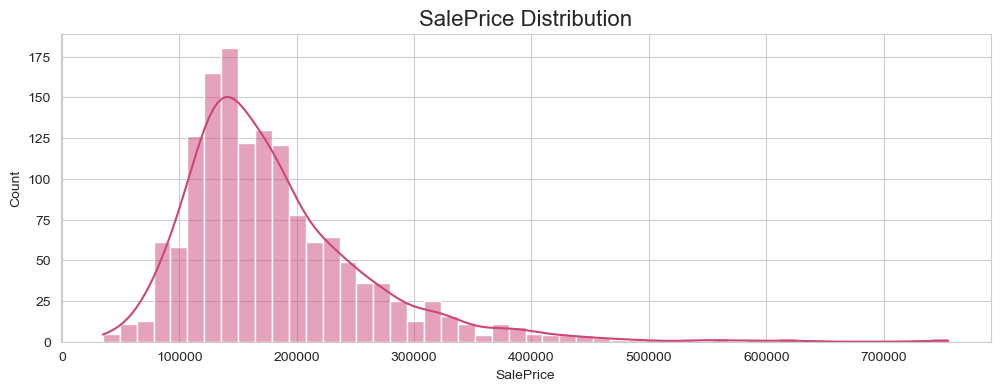

In [8]:
# SalePrice Distribution (Train Data)
plt.figure(figsize=(12, 4))
sns.histplot(train['SalePrice'], kde=True, bins=50, color=sns.color_palette("plasma", 1)[0])
plt.title("SalePrice Distribution", fontsize=16)
plt.xlabel("SalePrice")
plt.ylabel("Count")
plt.show()

#### Missing Value Analysis

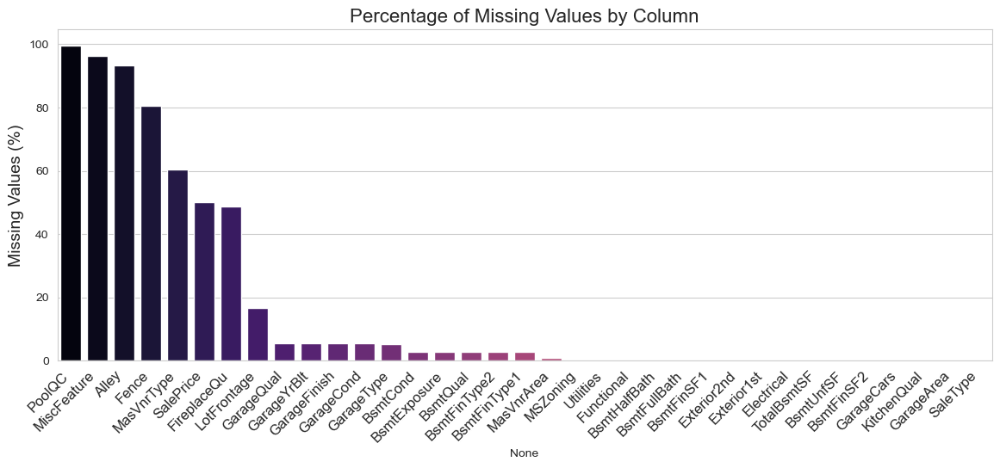

In [9]:
# Missing Values Heatmap and Bar Plot
missing_percent = full_data.isnull().sum() / len(full_data) * 100
missing_percent = missing_percent[missing_percent > 0].sort_values(ascending=False)

#plot value using bar plot
plt.figure(figsize=(14, 5))
sns.barplot(x=missing_percent.index, y=missing_percent.values, palette="magma")
plt.xticks(rotation=45, ha='right', fontsize=12)
plt.ylabel("Missing Values (%)", fontsize=14)
plt.title("Percentage of Missing Values by Column", fontsize=16)
plt.show()


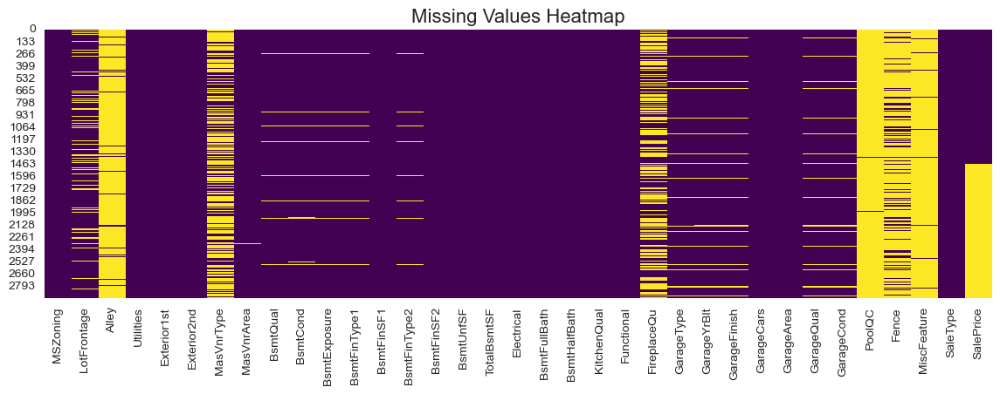

In [10]:
#plot using heatmap (It is optional you can use or not)
missing_cols = full_data.columns[full_data.isnull().sum() > 0]
plt.figure(figsize=(14, 4))
sns.heatmap(full_data[missing_cols].isnull(), cbar=False, cmap='viridis')
plt.title("Missing Values Heatmap", fontsize=16)
plt.show()

#### Numeric Feature Analysis

Total Number of Numeric features: 38
----------------------------------
List of Numeric features:
--------------------------
['Id', 'MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']
Duplicate Columns: Index([], dtype='object')


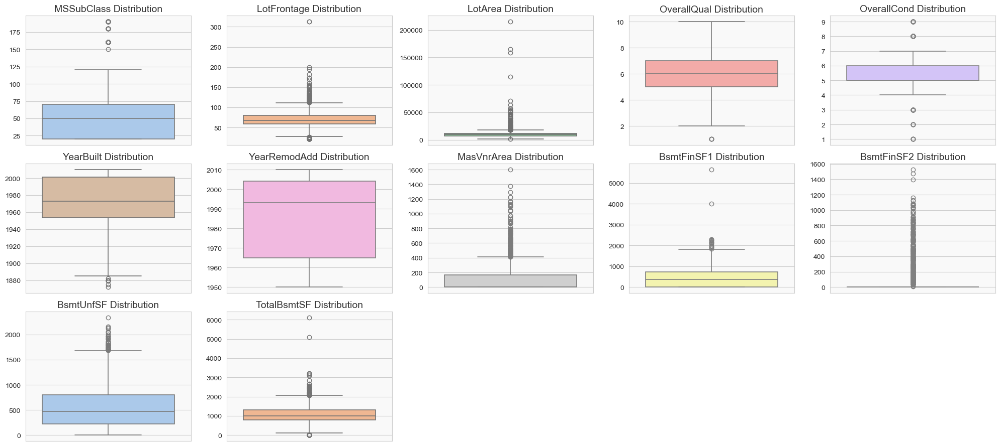

In [11]:
# Numeric Features Statistical Summary
numeric_features = full_data.select_dtypes(include=np.number).columns.tolist()
print('Total Number of Numeric features:', len(numeric_features))
print('--' * 17)
print(f'List of Numeric features:\n--------------------------\n{numeric_features}')

# Check duplicate column names
dup_cols = full_data.columns[full_data.columns.duplicated()].unique()
print("Duplicate Columns:", dup_cols)

# Boxplots for Numeric Features
numeric_features = [col for col in numeric_features if col not in ['Id', 'SalePrice']]
sample_numeric = numeric_features[:12]
cols = 5
rows = (len(sample_numeric) + cols - 1) // cols
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(20, 3*rows))
axs = np.ravel(axs)

palette_colors = sns.color_palette("pastel", n_colors=len(sample_numeric))
for i, ax in enumerate(axs):
    if i >= len(sample_numeric):
        fig.delaxes(ax)
    else:
        col = sample_numeric[i]
        sns.boxplot(y=full_data[col], ax=ax, color=palette_colors[i], fliersize=6, linewidth=1.2)
        ax.set_facecolor("#f9f9f9")
        ax.set_title(f"{col} Distribution", fontsize=14, color="#333333")
        ax.set_xlabel("")
        ax.set_ylabel("")
plt.tight_layout()
plt.show()

#### Correlation Analysis

In [12]:
# Top Correlated Features vs SalePrice
train_rows = full_data['SalePrice'].notnull()
numeric_features = full_data.select_dtypes(include=np.number).columns.tolist()
numeric_features.remove('SalePrice')

corr_with_target = full_data.loc[train_rows, numeric_features + ['SalePrice']].corr()['SalePrice'].sort_values(ascending=False)
top_features = corr_with_target.drop('SalePrice').head(20).index.tolist()

print("Top correlated features:", top_features)

Top correlated features: ['OverallQual', 'GrLivArea', 'GarageCars', 'GarageArea', 'TotalBsmtSF', '1stFlrSF', 'FullBath', 'TotRmsAbvGrd', 'YearBuilt', 'YearRemodAdd', 'GarageYrBlt', 'MasVnrArea', 'Fireplaces', 'BsmtFinSF1', 'LotFrontage', 'WoodDeckSF', '2ndFlrSF', 'OpenPorchSF', 'HalfBath', 'LotArea']


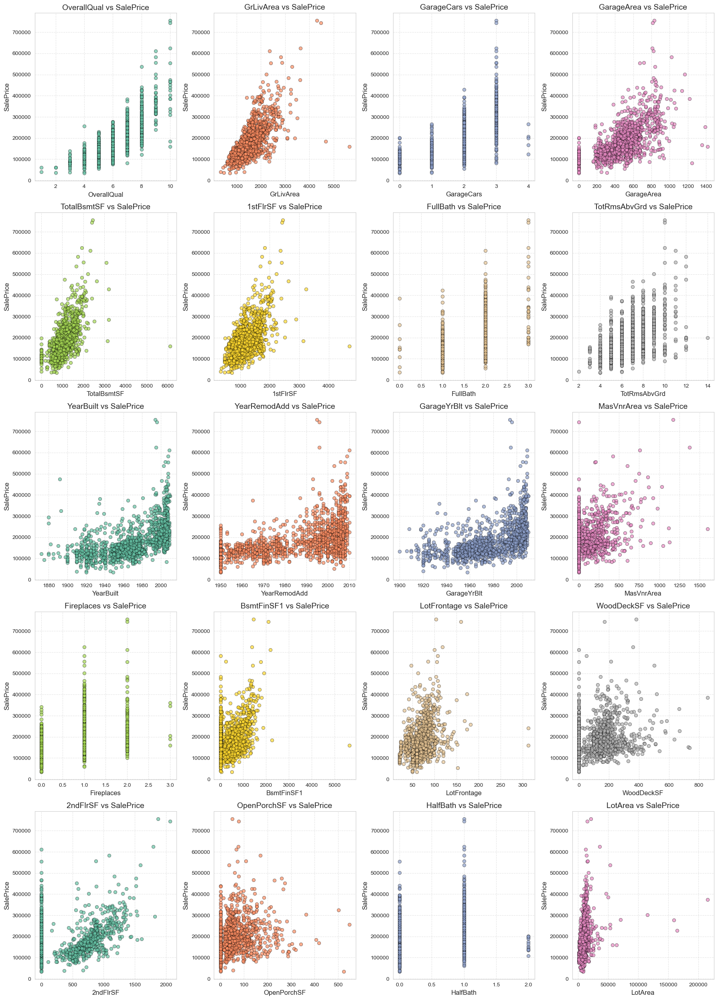

In [13]:
# Scatter Plots for top corelated feature
cols = 4
rows = (len(top_features) + cols - 1) // cols
fig, axs = plt.subplots(nrows=rows, ncols=cols, figsize=(18, 5*rows))
axs = axs.flatten()
palette = sns.color_palette("Set2", len(top_features))

for i, feature in enumerate(top_features):
    sns.scatterplot(
        x=full_data.loc[train_rows, feature],
        y=full_data.loc[train_rows, 'SalePrice'], ax=axs[i],
        color=palette[i], alpha=0.7, edgecolor='k'
    )
    axs[i].set_title(f"{feature} vs SalePrice", fontsize=14)
    axs[i].set_xlabel(feature, fontsize=12)
    axs[i].set_ylabel("SalePrice", fontsize=12)
    axs[i].grid(True, linestyle='--', alpha=0.5)

for j in range(i+1, len(axs)):
    fig.delaxes(axs[j])
plt.tight_layout()
plt.show()


In [14]:
# Plotly Correlation Heatmap
corr_matrix = full_data.loc[train_rows, numeric_features + ['SalePrice']].corr()
top_features = corr_matrix['SalePrice'].abs().sort_values(ascending=False).drop('SalePrice').head(20).index.tolist()
top_corr_matrix = corr_matrix.loc[top_features, top_features]

fig = px.imshow(
    top_corr_matrix,
    text_auto=".2f",
    color_continuous_scale='RdBu_r',
    origin='upper',
    aspect="auto",
    title="Top 20 Feature Correlation Heatmap (Train Data)",
    labels=dict(x="Features", y="Features", color="Correlation")
)
fig.update_layout(width=100, height=800, title=dict(font=dict(size=20)), xaxis_tickangle=-45)
fig.show()


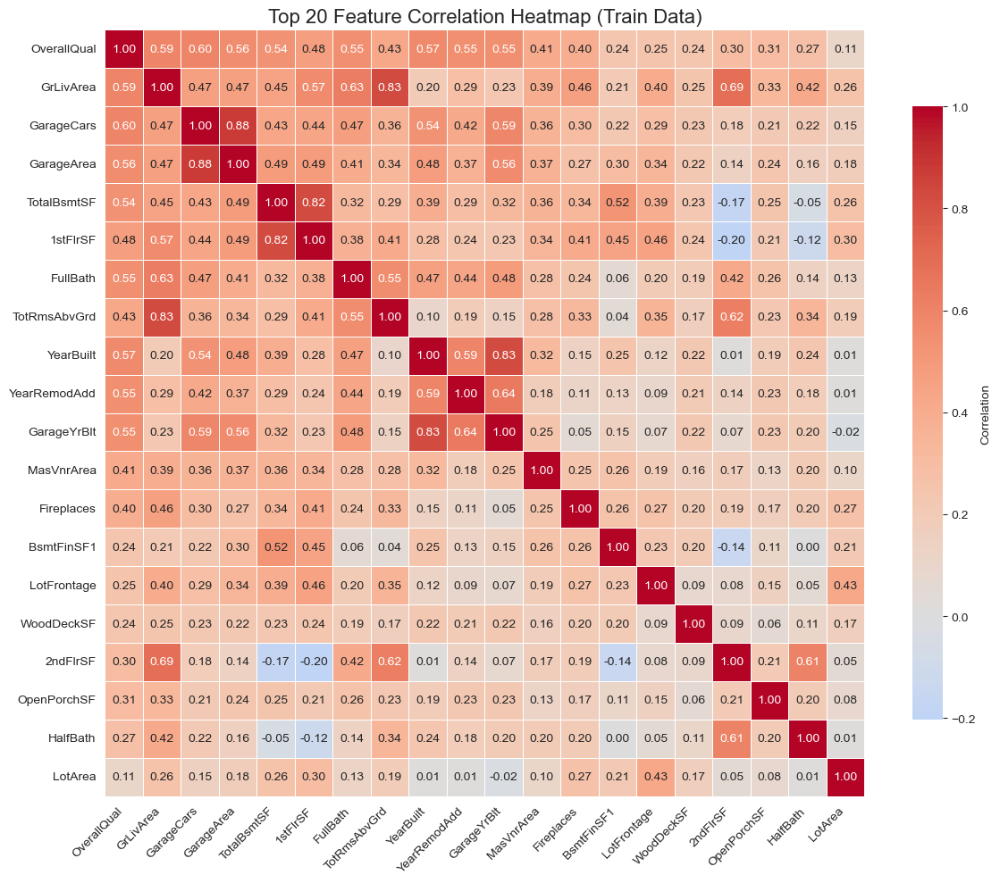

In [15]:
# Seaborn Correlation Heatmap (this plot is optional. it is just to plot using diffrent library)
plt.figure(figsize=(12, 10))
sns.heatmap(
    top_corr_matrix, annot=True, fmt=".2f", cmap="coolwarm", center=0,
    linewidths=0.5, cbar_kws={"shrink": 0.8, "label": "Correlation"}
)
plt.title("Top 20 Feature Correlation Heatmap (Train Data)", fontsize=16)
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()

#### Skewness Analysis

In [16]:
# Checking Skewness
train_rows = full_data['SalePrice'].notnull()
numeric_features = full_data.select_dtypes(include=np.number).columns.tolist()
numeric_features.remove('SalePrice')

skew_values = full_data.loc[train_rows, numeric_features].skew().sort_values(ascending=False)
print("Skewness of numeric features (train data):")
print(skew_values)

high_skew = skew_values[abs(skew_values) > 0.75]
print("\nHighly skewed features:")
print(high_skew)


Skewness of numeric features (train data):
MiscVal          24.476794
PoolArea         14.828374
LotArea          12.207688
3SsnPorch        10.304342
LowQualFinSF      9.011341
KitchenAbvGr      4.488397
BsmtFinSF2        4.255261
ScreenPorch       4.122214
BsmtHalfBath      4.103403
EnclosedPorch     3.089872
MasVnrArea        2.669084
OpenPorchSF       2.364342
LotFrontage       2.163569
BsmtFinSF1        1.685503
WoodDeckSF        1.541376
TotalBsmtSF       1.524255
MSSubClass        1.407657
1stFlrSF          1.376757
GrLivArea         1.366560
BsmtUnfSF         0.920268
2ndFlrSF          0.813030
OverallCond       0.693067
TotRmsAbvGrd      0.676341
HalfBath          0.675897
Fireplaces        0.649565
BsmtFullBath      0.596067
OverallQual       0.216944
MoSold            0.212053
BedroomAbvGr      0.211790
GarageArea        0.179981
YrSold            0.096269
FullBath          0.036562
Id                0.000000
GarageCars       -0.342549
YearRemodAdd     -0.503562
YearBuilt   

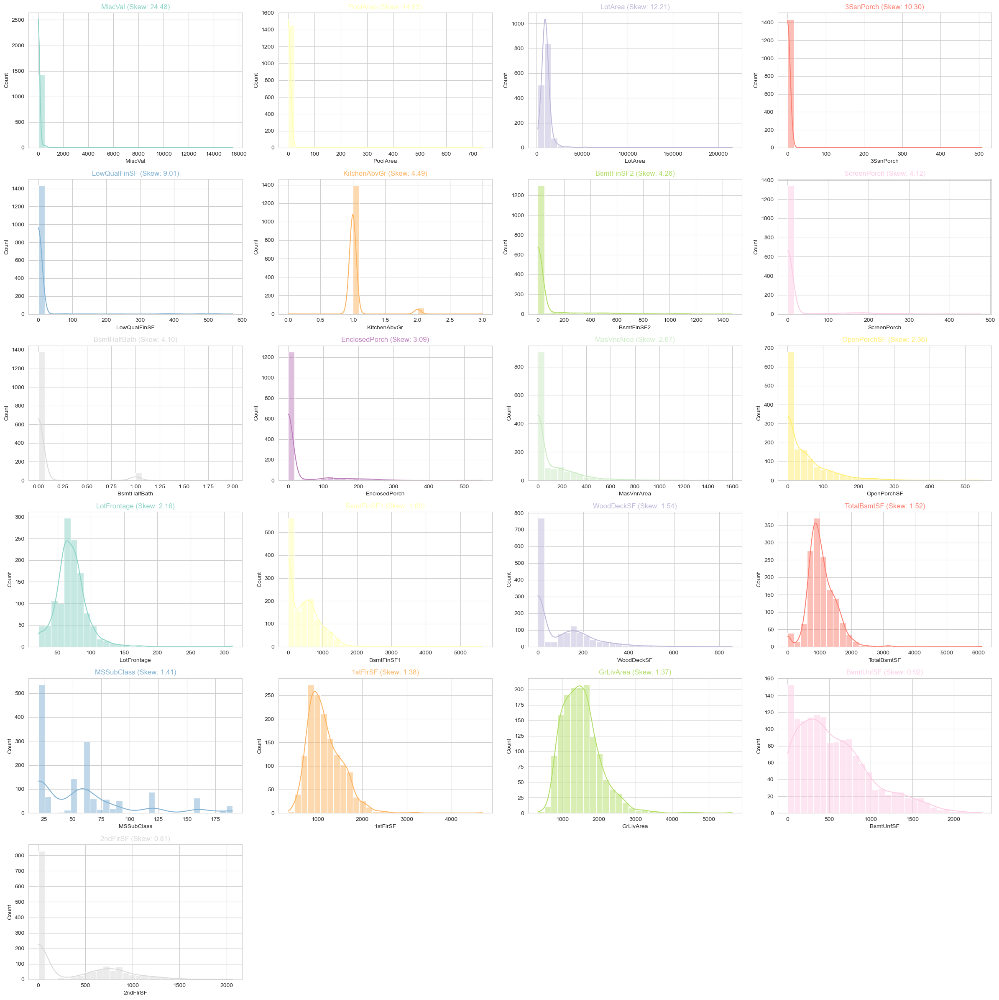

In [17]:
# Plot Highly Skewed Features
palette = sns.color_palette("Set3", len(high_skew))
cols = 4
rows = (len(high_skew) + cols - 1) // cols
plt.figure(figsize=(6*cols, 4*rows))

for i, feature in enumerate(high_skew.index):
    plt.subplot(rows, cols, i+1)
    sns.histplot(
        full_data.loc[train_rows, feature],
        kde=True, color=palette[i], bins=30
    )
    plt.title(f"{feature} (Skew: {high_skew[feature]:.2f})", fontsize=12, color=palette[i])
    plt.xlabel(feature)
    plt.ylabel("Count")
plt.tight_layout()
plt.show()

#### Catagorical feature Analysis

Total Number of Catagorical features: 44
----------------------------------
List of Catagorical features:
--------------------------
['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinType2', 'Heating', 'HeatingQC', 'CentralAir', 'Electrical', 'KitchenQual', 'Functional', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageQual', 'GarageCond', 'PavedDrive', 'PoolQC', 'Fence', 'MiscFeature', 'SaleType', 'SaleCondition', 'dataset']
Total Categorical Features: 43
Categorical Features: ['MSZoning', 'Street', 'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType', 'HouseStyle', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 

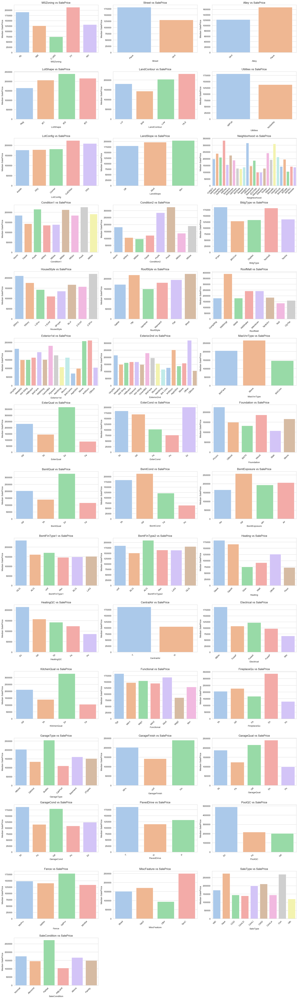

In [18]:
# Categorical Features Analysis
categorical_features = full_data.select_dtypes(include=['object', 'category']).columns.tolist()
print('Total Number of Catagorical features:', len(categorical_features))
print('--' * 17)
print(f'List of Catagorical features:\n--------------------------\n{categorical_features}')

if 'dataset' in categorical_features:
    categorical_features.remove('dataset')
print(f"Total Categorical Features: {len(categorical_features)}")
print("Categorical Features:", categorical_features)

# Plot Categorical Features vs SalePrice
train_rows = full_data['SalePrice'].notnull()
categorical_features = [col for col in full_data.select_dtypes(include='object').columns if col != 'dataset']
cols = 3
rows = (len(categorical_features) + cols - 1) // cols
plt.figure(figsize=(6*cols, 4*rows))
palette = sns.color_palette("Set2", len(categorical_features))

for i, feature in enumerate(categorical_features):
    plt.subplot(rows, cols, i+1)
    sns.barplot(
        x=feature, y='SalePrice', data=full_data.loc[train_rows],
        ci=None, palette="pastel"
    )
    plt.title(f"{feature} vs SalePrice", fontsize=12)
    plt.xlabel(feature)
    plt.ylabel("Median SalePrice")
    plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

#### Outlier Detection

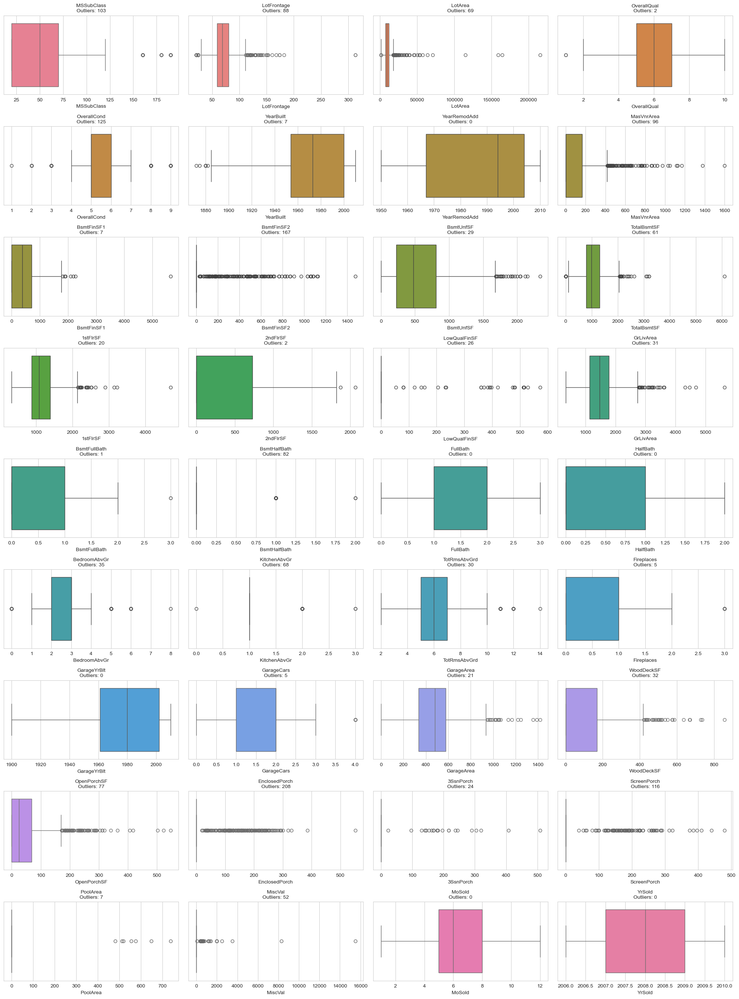

In [19]:
# Outlier Detection
train_rows = full_data['SalePrice'].notnull()
numeric_features = full_data.select_dtypes(include=['int64', 'float64']).columns.tolist()
numeric_features = [col for col in numeric_features if col not in ['Id', 'SalePrice']]

outlier_limits = {}
outlier_summary = []
palette = sns.color_palette("husl", len(numeric_features))

cols = 4
rows = (len(numeric_features) + cols - 1) // cols
plt.figure(figsize=(5 * cols, 3 * rows))

for i, feature in enumerate(numeric_features):
    Q1 = full_data.loc[train_rows, feature].quantile(0.25)
    Q3 = full_data.loc[train_rows, feature].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    
    outlier_limits[feature] = (lower, upper)
    outlier_count = full_data.loc[train_rows, feature].apply(lambda x: x < lower or x > upper).sum()
    outlier_summary.append([feature, outlier_count, lower, upper])
    
    plt.subplot(rows, cols, i+1)
    sns.boxplot(x=full_data.loc[train_rows, feature], color=palette[i])
    plt.title(f"{feature}\nOutliers: {outlier_count}", fontsize=10)
plt.tight_layout()
plt.show()


In [20]:
# Check outlier summary
outlier_summary_df = pd.DataFrame(outlier_summary, columns=['Feature', 'Outlier Count', 'Lower Bound', 'Upper Bound'])
outlier_summary_df = outlier_summary_df.sort_values(by='Outlier Count', ascending=False)
print("\n         --- Outlier Detection Summary ---")
display(outlier_summary_df)


         --- Outlier Detection Summary ---


,Feature,Outlier Count,Lower Bound,Upper Bound
29,EnclosedPorch,208,0.000,0.000
9,BsmtFinSF2,167,0.000,0.000
4,OverallCond,125,3.500,7.500
31,ScreenPorch,116,0.000,0.000
0,MSSubClass,103,-55.000,145.000
7,MasVnrArea,96,-249.000,415.000
1,LotFrontage,88,27.500,111.500
17,BsmtHalfBath,82,0.000,0.000
28,OpenPorchSF,77,-102.000,170.000
2,LotArea,69,1481.500,17673.500


## Data Preprocessing

In [21]:
# Define train/test masks

''' Create boolean masks to separate train and test data:
- train_rows: True where SalePrice is not null (training data)
- test_rows: True where SalePrice is null (test data)'''

train_rows = full_data['SalePrice'].notnull()
test_rows = ~train_rows

# Save Ids for submission
id_train = full_data.loc[train_rows, 'Id']
id_test = full_data.loc[test_rows, 'Id']
full_data = full_data.drop(columns=['Id'])  # Drop Id early

# Numeric and categorical features
numeric_features = full_data.select_dtypes(include=np.number).columns.tolist()
numeric_features.remove('SalePrice')
categorical_features = full_data.select_dtypes(include='object').columns.tolist()

# Handle skewness (train-based)
skew_values = full_data.loc[train_rows, numeric_features].skew()
high_skew = skew_values[abs(skew_values) > 0.75]
print("Highly skewed features (train data):\n", high_skew)
full_data[high_skew.index] = np.log1p(full_data[high_skew.index])  # Apply to all
skew_after = full_data.loc[train_rows, high_skew.index].skew()
print("\nSkewness after log1p transformation (train data):\n", skew_after)

# Outlier capping (train-based limits)
for feature, (lower, upper) in outlier_limits.items():
    full_data[feature] = np.clip(full_data[feature], lower, upper)
print("Outlier capping complete for all numeric features!")

# Missing values (fit on train)
num_imputer = SimpleImputer(strategy='median')
cat_imputer = SimpleImputer(strategy='constant', fill_value='None')
num_imputer.fit(full_data.loc[train_rows, numeric_features])
cat_imputer.fit(full_data.loc[train_rows, categorical_features])
full_data[numeric_features] = num_imputer.transform(full_data[numeric_features])
full_data[categorical_features] = cat_imputer.transform(full_data[categorical_features])

# Verify missing values
missing_cat = full_data[categorical_features].isnull().sum()
missing_num = full_data[numeric_features].isnull().sum()
print(f"Remaining missing in categorical features:\n{missing_cat}")
print(f"\nRemaining missing in numeric features:\n{missing_num}")

# Rare label handling
rare_thresh = 0.01
for col in categorical_features:
    freq = full_data.loc[train_rows, col].value_counts(normalize=True)
    rare_labels = freq[freq < rare_thresh].index
    full_data[col] = full_data[col].replace(rare_labels, 'Other')

# Ordinal mapping (before encoding)
qual_map = {'Ex': 5, 'Gd': 4, 'TA': 3, 'Fa': 2, 'Po': 1, 'None': 0}
qual_cols = ['ExterQual', 'ExterCond', 'BsmtQual', 'BsmtCond', 'HeatingQC',
             'KitchenQual', 'FireplaceQu', 'GarageQual', 'GarageCond', 'PoolQC']
for col in qual_cols:
    if col in full_data.columns:
        full_data[col] = full_data[col].map(qual_map).fillna(0)
        if col in categorical_features:
            categorical_features.remove(col)
            numeric_features.append(col)

# One-hot encoding (fit on train)
encoder = OneHotEncoder(sparse_output=False, handle_unknown='ignore')
encoder.fit(full_data.loc[train_rows, categorical_features])
encoded_all = encoder.transform(full_data[categorical_features])
encoded_cols = encoder.get_feature_names_out(categorical_features)
encoded_df = pd.DataFrame(encoded_all, columns=encoded_cols, index=full_data.index)

# Update dataset
full_data = full_data.drop(columns=categorical_features)
full_data = pd.concat([full_data, encoded_df], axis=1)
print("Categorical features encoded. Shape:", full_data.shape)

Highly skewed features (train data):
 MSSubClass        1.407657
LotFrontage       2.163569
LotArea          12.207688
MasVnrArea        2.669084
BsmtFinSF1        1.685503
BsmtFinSF2        4.255261
BsmtUnfSF         0.920268
TotalBsmtSF       1.524255
1stFlrSF          1.376757
2ndFlrSF          0.813030
LowQualFinSF      9.011341
GrLivArea         1.366560
BsmtHalfBath      4.103403
KitchenAbvGr      4.488397
WoodDeckSF        1.541376
OpenPorchSF       2.364342
EnclosedPorch     3.089872
3SsnPorch        10.304342
ScreenPorch       4.122214
PoolArea         14.828374
MiscVal          24.476794
dtype: float64

Skewness after log1p transformation (train data):
 MSSubClass        0.248997
LotFrontage      -0.728728
LotArea          -0.137404
MasVnrArea        0.494418
BsmtFinSF1       -0.618410
BsmtFinSF2        2.523694
BsmtUnfSF        -2.186504
TotalBsmtSF      -5.154670
1stFlrSF          0.080114
2ndFlrSF          0.289643
LowQualFinSF      7.460317
GrLivArea        -0.006140
Bsmt

## Feature Engineering

In [22]:
# Feature Engineering
full_data['HouseAge'] = full_data['YrSold'] - full_data['YearBuilt']
full_data['RemodAge'] = full_data['YrSold'] - full_data['YearRemodAdd']
full_data['SoldMonth'] = full_data['MoSold']
full_data['TotalBath'] = (full_data['BsmtFullBath'] + 0.5*full_data['BsmtHalfBath'] +
                          full_data['FullBath'] + 0.5*full_data['HalfBath'])
full_data['TotalSF'] = full_data['TotalBsmtSF'] + full_data['1stFlrSF'] + full_data['2ndFlrSF']
full_data['TotalPorch'] = (full_data['OpenPorchSF'] + full_data['EnclosedPorch'] +
                           full_data['3SsnPorch'] + full_data['ScreenPorch'])
full_data['GrLivArea_per_Room'] = full_data['GrLivArea'] / (full_data['TotRmsAbvGrd'] + 1)
full_data['GarageCars_per_Area'] = full_data['GarageCars'] / (full_data['GarageArea'] + 1)

new_features = ['HouseAge', 'RemodAge', 'SoldMonth', 'TotalSF', 'TotalBath', 'TotalPorch',
                'GrLivArea_per_Room', 'GarageCars_per_Area']
print("List of features created in Feature Engineering:")
for f in new_features:
    print("-", f)

List of features created in Feature Engineering:
- HouseAge
- RemodAge
- SoldMonth
- TotalSF
- TotalBath
- TotalPorch
- GrLivArea_per_Room
- GarageCars_per_Area


## Feature Scaling and Data Split

#### Feature Scaling 

In [23]:
#  Feature Scaling and Train/Test Split
from sklearn.preprocessing import StandardScaler
import joblib

# Scale numeric features
scaler = StandardScaler()
scaler.fit(full_data.loc[train_rows, numeric_features])
full_data[numeric_features] = scaler.transform(full_data[numeric_features])

# Save scaler
joblib.dump(scaler, os.path.join(MODEL_PATH, "scaler.joblib"))


['C:\\Users\\shukl\\Vivek Study DS\\Git Project\\house-price-prediction\\models\\scaler.joblib']

##### Split train & test data

In [24]:
# Separate train/test
X_train = full_data.loc[train_rows].drop(columns=['SalePrice'], errors='ignore')
y_train = full_data.loc[train_rows, 'SalePrice']
X_test = full_data.loc[test_rows].drop(columns=['SalePrice'], errors='ignore')

#print train and test shap
print(f"X_train shape: {X_train.shape}, X_test shape: {X_test.shape}")

X_train shape: (1460, 224), X_test shape: (1459, 224)


In [25]:
print("Preprocessing Done!")

Preprocessing Done!


## Model Selection and Definition

In [26]:
# Model Selection and Definition
# Models Used:
'''
- RandomForestRegressor: Tree-based ensemble averaging multiple trees.
- XGBRegressor: Optimized gradient boosting with regularization.
- LGBMRegressor: Fast gradient boosting for large datasets.
- GradientBoostingRegressor: Sequential tree building to minimize errors.
- CatBoostRegressor: Handles categorical features well.
- StackingRegressor: Combines all above with a meta-model.
'''

# DefineModels
rf_model = RandomForestRegressor(n_estimators=500, max_depth=12, min_samples_split=5, random_state=42, n_jobs=-1)
xgb_model = XGBRegressor(n_estimators=500, learning_rate=0.05, max_depth=4, subsample=0.8,
                         colsample_bytree=0.8, random_state=42, n_jobs=-1)
lgb_model = LGBMRegressor(n_estimators=500, learning_rate=0.05, max_depth=-1, subsample=0.8,
                          colsample_bytree=0.8, random_state=42, verbose=-1)
gbr_model = GradientBoostingRegressor(n_estimators=500, learning_rate=0.05, max_depth=4, random_state=42)
cat_model = CatBoostRegressor(iterations=500, learning_rate=0.05, depth=4, random_state=42, verbose=0)
stack_model = StackingRegressor(
    estimators=[
        ('rf', rf_model),
        ('xgb', xgb_model),
        ('gbr', gbr_model),
        ('lgb', lgb_model),
        ('catb', cat_model)
    ],
    final_estimator=LinearRegression(), n_jobs=-1)

## Model Training & Evaluation

In [27]:
# Preparing Models for Training
'''A dictionary to store and manage all trained regression models.
This makes it easy to iterate through them for training, evaluation, or comparison.'''
def cv_rmse(model, X, y, cv=5):
    scores = np.sqrt(-cross_val_score(model, X, y, cv=cv, scoring='neg_mean_squared_error'))
    return scores

models = {
    'RandomForest': rf_model,
    'XGBoost': xgb_model,
    'LightGBM': lgb_model,
    'GradientBoosting': gbr_model,
    'CatBoost' : cat_model,    
    'Stacking': stack_model}

results = []
best_model = None
best_model_name = None
best_rmse = float("inf")

for name, model in models.items():
    # Show training in progress
    print(f"{name} Model Training ...", end='', flush=True)
    
    # Train model
    model.fit(X_train, y_train)
    y_pred = model.predict(X_train)
    
    # Calculate training metrics
    rmse = np.sqrt(mean_squared_error(y_train, y_pred))
    mae = mean_absolute_error(y_train, y_pred)
    r2 = r2_score(y_train, y_pred)
    
    # Calculate CV RMSE
    std = cv_rmse(model, X_train, y_train).std()
    mean_cv_rmse = cv_rmse(model, X_train, y_train).mean()
    
    # Store results
    results.append({
        'Model': name,
        'RMSE': rmse,
        'MAE': mae,
        'R2': r2,
        'Std RMSE': std,
        'Mean CV RMSE': mean_cv_rmse})
    
    # Update best model based on CV RMSE
    if mean_cv_rmse < best_rmse:
        best_rmse = mean_cv_rmse
        best_model = model
        best_model_name = name
    
    # Overwrite previous line and print trained message with metrics
    sys.stdout.write('\r' + ' ' * 120 + '\r')  # Clear line
    print(f"{name} Model Trained.\n{name}_training Result with metrics: RMSE={rmse:.2f}, MAE={mae:.2f}, R2={r2:.2f}, Std={std:.2f}, Mean CV RMSE={mean_cv_rmse:.2f}\n")

# Final results table
results_df = pd.DataFrame(results)

RandomForest Model Trained.                                                                                             
RandomForest_training Result with metrics: RMSE=13919.33, MAE=8894.32, R2=0.97, Std=4309.24, Mean CV RMSE=31755.54

XGBoost Model Trained.                                                                                                  
XGBoost_training Result with metrics: RMSE=7732.67, MAE=5872.43, R2=0.99, Std=4879.66, Mean CV RMSE=28268.50

LightGBM Model Trained.                                                                                                 
LightGBM_training Result with metrics: RMSE=5746.69, MAE=2967.92, R2=0.99, Std=4869.65, Mean CV RMSE=30883.68

GradientBoosting Model Trained.                                                                                         
GradientBoosting_training Result with metrics: RMSE=7389.17, MAE=5735.93, R2=0.99, Std=4126.13, Mean CV RMSE=28999.17

CatBoost Model Trained.                                     

In [28]:
# Function to highlight best model row
def highlight_best_row(row):
    if row['Model'] == best_model_name:
        # Full row light green
        return ['background-color: #004d40; color:white; font-weight:bold']*len(row)
    else:
        # Normal row
        return ['']*len(row)

# Function to highlight the metric (CV RMSE) which made the model best
def highlight_best_metric(row):
    style = ['']*len(row)
    if row['Model'] == best_model_name:
        # Find the column that determined best model
        col_index = row.index.get_loc('Mean CV RMSE')
        style[col_index] = 'background-color: darkred; color:white; font-weight:bold'
    return style

# Combine styles
styled_table = results_df.style.apply(highlight_best_row, axis=1)\
                                .apply(highlight_best_metric, axis=1)

print(' ')
print("                   Model Comparison Table with Best Highlight ")
print("="*80)

display(styled_table)

 
                   Model Comparison Table with Best Highlight 


,Model,RMSE,MAE,R2,Std RMSE,Mean CV RMSE
0,RandomForest,13919.333679,8894.323088,0.969279,4309.235610,31755.539335
1,XGBoost,7732.665554,5872.428866,0.990519,4879.663536,28268.498598
2,LightGBM,5746.692542,2967.923373,0.994764,4869.646493,30883.675770
3,GradientBoosting,7389.165200,5735.933256,0.991343,4126.125919,28999.174769
4,CatBoost,14517.614962,10930.847530,0.966582,3753.700866,28227.960678
5,Stacking,11461.025486,8790.584702,0.979172,4385.968023,28151.881569


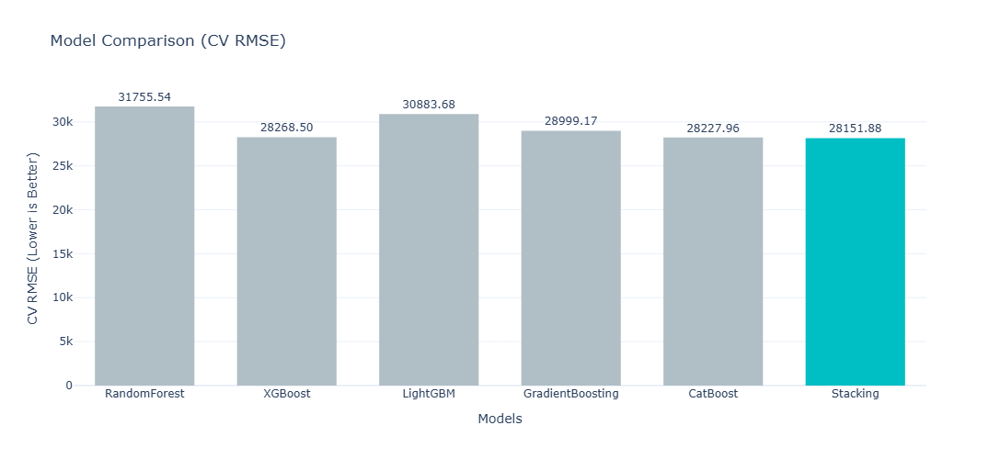


 Best model: Stacking with CV RMSE = 28151.88
-----------------------------------------------
 


In [29]:
#Plotting best_model using plotly
# define color palette
best_color = '#00BFC4'     # Bright teal for best model
other_color = '#B0BEC5'    # Soft grey-blue for others

colors = [best_color if m == best_model_name else other_color for m in results_df['Model']]
results_df['Color'] = colors

# Plotly bar
fig = px.bar(results_df,x='Model',y='Mean CV RMSE',
    text='Mean CV RMSE',
    color='Color',
    hover_data=['RMSE', 'MAE', 'R2', 'Std RMSE','Mean CV RMSE'],
    color_discrete_map="identity",
    title="Model Comparison (CV RMSE)",
    width=1100,height=500)

fig.update_traces(
    texttemplate='%{text:.2f}',
    textposition='outside',
    marker_line_color=None,   # No border
    marker_line_width=0)

fig.update_layout(
    hoverlabel=dict(font_size=12,font_color='white',bgcolor='#333333',font_family="Arial"),
    yaxis_title="CV RMSE (Lower is Better)",
    xaxis_title="Models",showlegend=False,
    template="plotly_white",uniformtext_minsize=12,uniformtext_mode='hide',
    bargap=0.3)

fig.show()
print(f"\n Best model: {best_model_name} with CV RMSE = {best_rmse:.2f}")
print('-'*47)
print(' ')

## Train and Save Model

In [30]:
# Train and save the best model
if best_model is not None and best_model_name is not None:
    print(f"\nBest model selected: {best_model_name} with Mean CV RMSE={best_rmse:.2f}")
    
    # Retrain the best model on the full training data
    best_model.fit(X_train, y_train)
    
    # Save the best model
    os.makedirs("models", exist_ok=True)  # Ensure the models directory exists
    model_file = os.path.join("models", "best_model.joblib")
    joblib.dump(best_model, model_file)
    print(f"{best_model_name} model saved to {model_file}")
    
    # Verify the saved model
    loaded_model = joblib.load(model_file)
    print(f"Verified: Loaded model type is {type(loaded_model).__name__}")
else:
    print("\nError: No best model was selected. Please check the model evaluation process.")



Best model selected: Stacking with Mean CV RMSE=28151.88
Stacking model saved to models\best_model.joblib
Verified: Loaded model type is StackingRegressor


In [31]:
if mean_cv_rmse < best_rmse:
    best_rmse = mean_cv_rmse
    best_model = model
    best_model_name = name
    print(f"\nNew best model found: {name} (Type: {type(model).__name__}) with Mean CV RMSE={mean_cv_rmse:.2f} (Previous best RMSE: {best_rmse:.2f})")

## Prediction on Model

In [32]:
# Train & Save Best Model
print(f"\nBest model selected: {best_model_name} with CV RMSE={best_rmse:.2f}")
print(' ')
best_model.fit(X_train, y_train)


Best model selected: Stacking with CV RMSE=28151.88
 


StackingRegressor(estimators=[('rf',
                               RandomForestRegressor(max_depth=12,
                                                     min_samples_split=5,
                                                     n_estimators=500,
                                                     n_jobs=-1,
                                                     random_state=42)),
                              ('xgb',
                               XGBRegressor(base_score=None, booster=None,
                                            callbacks=None,
                                            colsample_bylevel=None,
                                            colsample_bynode=None,
                                            colsample_bytree=0.8, device=None,
                                            early_stopping_rounds=None,
                                            enable_categorical=False,
                                            eval_metric=None,
                                            fea...
                                            num_parallel_tree=None, ...)),
                              ('gbr',
                               GradientBoostingRegressor(learning_rate=0.05,
                                                         max_depth=4,
                                                         n_estimators=500,
                                                         random_state=42)),
                              ('lgb',
                               LGBMRegressor(colsample_bytree=0.8,
                                             learning_rate=0.05,
                                             n_estimators=500, random_state=42,
                                             subsample=0.8, verbose=-1)),
                              ('catb',
                               <catboost.core.CatBoostRegressor object at 0x000001FC213F0980>)],
                  final_estimator=LinearRegression(), n_jobs=-1)

### Feature Importence

In [33]:
# Ploting Feature Importance
if hasattr(best_model, 'feature_importances_'):
    importances = best_model.feature_importances_
    feat_names = X_train.columns
    fi_df = pd.DataFrame({"Feature": feat_names, "Importance": importances}).sort_values(by="Importance", ascending=False).head(20)
    min_imp = fi_df['Importance'].min()
    max_imp = fi_df['Importance'].max()
    fi_df['Importance_norm'] = (fi_df['Importance'] - min_imp) / (max_imp - min_imp + 1e-6)
    fi_df['Color'] = fi_df['Importance_norm'].apply(lambda x: f'rgba(0,191,196,{0.3 + 0.7*x:.2f})')
    
    fig = px.bar(
        fi_df[::-1], x='Importance', y='Feature', orientation='h', text='Importance',
        color='Color', color_discrete_map="identity",
        title=f'Top 20 Feature Importances ({best_model_name})', width=1100, height=500)
    
    fig.update_traces(texttemplate='%{text:.4f}', textposition='outside')
    fig.update_layout(xaxis_title="Importance", yaxis_title="Feature", template="plotly_white")
    fig.show()
else:
    print(f"{best_model_name} does not support feature importances.")

Stacking does not support feature importances.


### Submission

In [35]:
print("Length of id_test:", len(id_test))
print("Length of y_pred:", len(y_pred))

Length of id_test: 1459
Length of y_pred: 1460


In [37]:
# Assuming X_test is the test features and model is your trained model
print("Length of X_test:", len(X_test))
print("Length of id_test:", len(id_test))

# Ensure X_test matches id_test
if len(X_test) == len(id_test):
    y_pred = model.predict(X_test)
else:
    raise ValueError("X_test and id_test lengths do not match!")

# Prepare Submission
submission = pd.DataFrame({"Id": id_test, "SalePrice": y_pred})
submission_file = os.path.join(OUTPUT_PATH, "submission.csv")
submission.to_csv(submission_file, index=False)

Length of X_test: 1459
Length of id_test: 1459


In [38]:
# Trim id_test to match y_pred
id_test = id_test[:len(y_pred)]

# Prepare Submission
submission = pd.DataFrame({"Id": id_test, "SalePrice": y_pred})
submission_file = os.path.join(OUTPUT_PATH, "submission.csv")
submission.to_csv(submission_file, index=False)

### Hyperparameter Tuning

In [39]:
# setting Hyperparameter Tuning for improving the model performance
rf_params = {'n_estimators': randint(100, 500),'max_depth': randint(3, 15),
    'min_samples_split': randint(2, 10),'min_samples_leaf': randint(1, 5)}

xgb_params = {'n_estimators': randint(100, 500),'max_depth': randint(3, 10),
    'learning_rate': uniform(0.01, 0.1),'subsample': uniform(0.6, 0.4)}

lgb_params = {'n_estimators': randint(100, 500),'num_leaves': randint(20, 50),'learning_rate': uniform(0.01, 0.1),
              'subsample': uniform(0.6, 0.4)}

gbr_params = {'n_estimators': randint(100, 500),'max_depth': randint(3, 10),'learning_rate': uniform(0.01, 0.1),
              'subsample': uniform(0.6, 0.4)}

cat_params = {'iterations': randint(200, 500),'depth': randint(3, 10),
    'learning_rate': uniform(0.01, 0.1),'l2_leaf_reg': randint(1, 10)}

n_iter_search = 20
cv = 5
scoring_metric = 'neg_root_mean_squared_error'

models_random = {
    'RandomForest': (RandomForestRegressor(random_state=42), rf_params),
    'XGBoost': (XGBRegressor(random_state=42, verbosity=0), xgb_params),
    'LightGBM': (LGBMRegressor(random_state=42), lgb_params),
    'GradientBoosting': (GradientBoostingRegressor(random_state=42), gbr_params),
    'CatBoost': (CatBoostRegressor(random_state=42, verbose=0), cat_params)}

best_models_random = {}
for name, (model, param) in models_random.items():
    print(f"\rRunning RandomizedSearchCV for {name} ...")
    rand_search = RandomizedSearchCV(
        estimator=model, param_distributions=param, n_iter=n_iter_search,
        cv=cv, scoring=scoring_metric, verbose=0, n_jobs=-1, random_state=42)
    rand_search.fit(X_train, y_train)
    best_models_random[name] = rand_search.best_estimator_
    print(f"Completed RandomizedSearch for: {name} | Best Params: {rand_search.best_params_}\n")

 Running RandomizedSearchCV for RandomForest ...
Completed RandomizedSearch for: RandomForest | Best Params: {'max_depth': 14, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 413}

 Running RandomizedSearchCV for XGBoost ...
Completed RandomizedSearch for: XGBoost | Best Params: {'learning_rate': np.float64(0.06632882178455393), 'max_depth': 4, 'n_estimators': 364, 'subsample': np.float64(0.6063865008880857)}

 Running RandomizedSearchCV for LightGBM ...
Completed RandomizedSearch for: LightGBM | Best Params: {'learning_rate': np.float64(0.028223608778806232), 'n_estimators': 487, 'num_leaves': 21, 'subsample': np.float64(0.7700623497964979)}

 Running RandomizedSearchCV for GradientBoosting ...
Completed RandomizedSearch for: GradientBoosting | Best Params: {'learning_rate': np.float64(0.05504992519695431), 'max_depth': 4, 'n_estimators': 487, 'subsample': np.float64(0.9768807022739411)}

 Running RandomizedSearchCV for CatBoost ...
Completed RandomizedSearch for: CatBo

### SHAP Plot


Training & Explaining Model: RandomForest


100%|===================| 1455/1460 [03:49<00:00]        

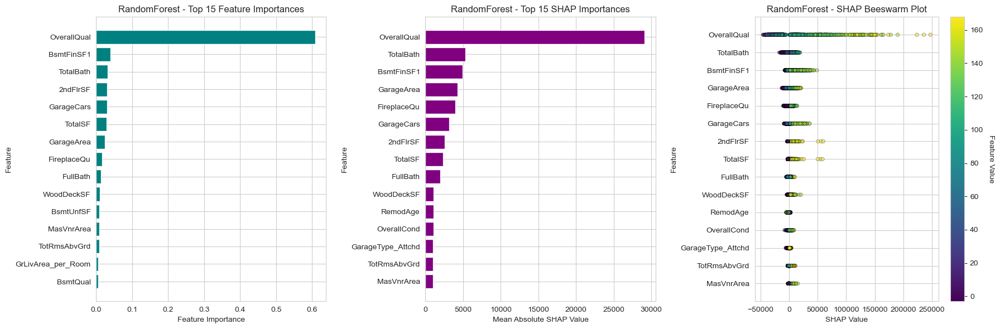


Training & Explaining Model: XGBoost


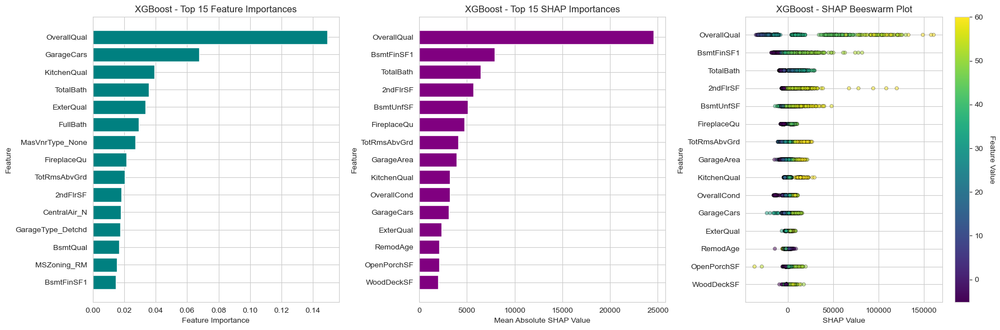


Training & Explaining Model: LightGBM


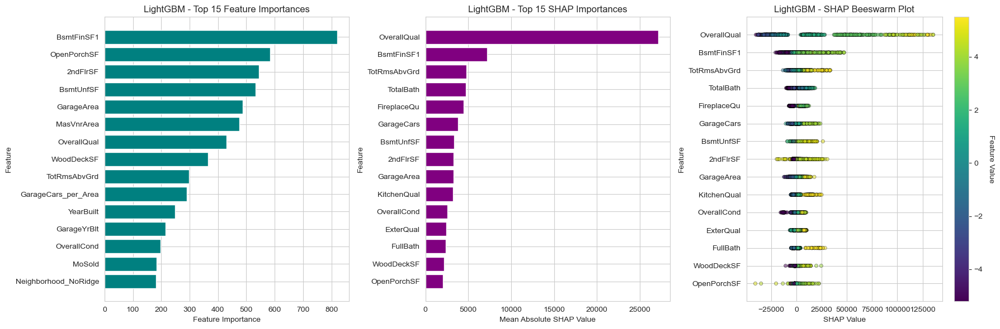


Training & Explaining Model: GradientBoosting


 94%|=================== | 1372/1460 [00:11<00:00]       

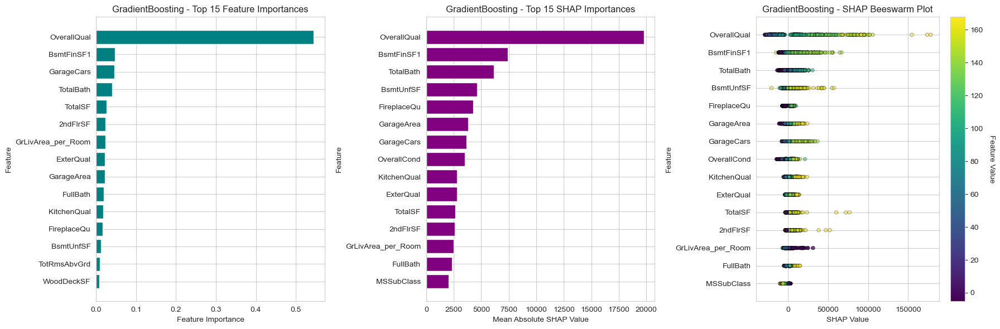


Training & Explaining Model: CatBoost


 99%|===================| 1444/1460 [00:31<00:00]        

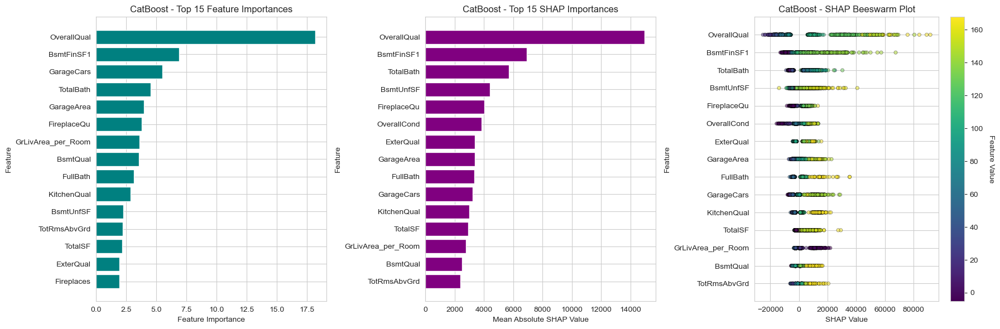

In [61]:
# initialize JavaScript
shap.initjs()

for name, model in best_models_random.items():
    print(f"\nTraining & Explaining Model: {name}")

    # Train the model
    model.fit(X_train, y_train)

    # Calculate SHAP values
    try:
        # Use an appropriate explainer based on the model type
        if "XGBoost" in name or "LightGBM" in name:
            explainer = shap.TreeExplainer(model)
        else:
            explainer = shap.Explainer(model, X_train)
        
        shap_values = explainer(X_train)
    except Exception as e:
        print(f"Could not generate SHAP values for {name}: {e}")
        continue
    
    #Plotting SHAP Plot
    fig, axes = plt.subplots(1, 3, figsize=(18, 6))

    ## Plotting Feature Importance 
    if hasattr(model, "feature_importances_"):
        feature_importance = model.feature_importances_
    elif name == "CatBoost":
        feature_importance = model.get_feature_importance()
    else:
        feature_importance = None

    if feature_importance is not None:
        importance_df = pd.DataFrame({"Feature": X_train.columns, 
            "Importance": feature_importance}).sort_values(by="Importance", ascending=False).head(15)
        
        axes[0].barh(importance_df["Feature"], importance_df["Importance"], color='teal')
        axes[0].set_title(f"{name} - Top 15 Feature Importances")
        axes[0].set_xlabel("Feature Importance")
        axes[0].set_ylabel("Feature")
        axes[0].invert_yaxis()
    else:
        print(f"{name} does not support feature_importances_.")

    ## Plotting SHAP Bar Plot
    shap_importance = np.abs(shap_values.values).mean(axis=0)
    shap_df = pd.DataFrame({"Feature": X_train.columns, 
        "SHAP": shap_importance}).sort_values(by="SHAP", ascending=False).head(15)

    axes[1].barh(shap_df["Feature"], shap_df["SHAP"], color='purple')
    axes[1].set_title(f"{name} - Top 15 SHAP Importances")
    axes[1].set_xlabel("Mean Absolute SHAP Value")
    axes[1].set_ylabel("Feature")
    axes[1].invert_yaxis()

    ## Plotting SHAP Beeswarm Plot Manually
    # Get the top 15 features and their indices
    top_features = np.argsort(np.sum(np.abs(shap_values.values), axis=0))[-15:]
    feature_names = X_train.columns[top_features]

    # Filter SHAP values and data to the top features
    shap_values_top = shap_values.values[:, top_features]
    X_train_top = X_train.iloc[:, top_features]

    # Create the beeswarm plot on axes[2]
    for i in range(len(feature_names)):
        feature_data = X_train_top.iloc[:, i]
        shap_data = shap_values_top[:, i]
        
        # Color points based on feature value
        colors = feature_data
        axes[2].scatter(shap_data, [i] * len(shap_data),c=colors, cmap='viridis', alpha=0.5, s=20,edgecolor='k', linewidth=0.5)

    axes[2].set_yticks(np.arange(len(feature_names)))
    axes[2].set_yticklabels(feature_names)
    axes[2].set_title(f"{name} - SHAP Beeswarm Plot")
    axes[2].set_xlabel("SHAP Value")
    axes[2].set_ylabel("Feature")
    axes[2].set_ylim(-1, len(feature_names))

    # Create a colorbar for the beeswarm plot
    sm = plt.cm.ScalarMappable(cmap='viridis')
    sm.set_array(X_train_top.values)
    cbar = fig.colorbar(sm, ax=axes[2])
    cbar.set_label('Feature Value', rotation=270, labelpad=15)

    plt.tight_layout()
    plt.show()

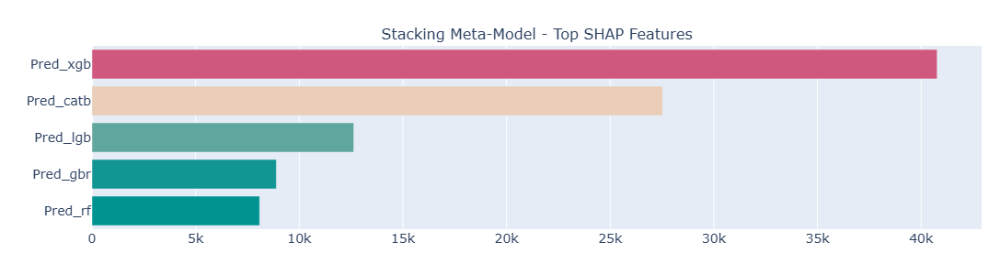

In [66]:
# Stacking Model SHAP
try:
    stack_model.fit(X_train, y_train)

    # Get base model predictions as features for the final estimator
    base_model_preds = np.hstack([est.fit(X_train, y_train).predict(X_train).reshape(-1, 1) for est in stack_model.estimators_])

    # Get the feature names for the meta-model
    feature_names = [f"Pred_{est[0]}" for est in stack_model.estimators]
    
    # Create a new explainer for the final estimator using the base model predictions
    explainer_stack = shap.Explainer(stack_model.final_estimator_, base_model_preds)
    shap_values_stack = explainer_stack(base_model_preds)

    # Plot SHAP values with correct feature names
    fig_stack = make_subplots(rows=1, cols=1, subplot_titles=("Stacking Meta-Model - Top SHAP Features",))

    shap_importance_stack = np.abs(shap_values_stack.values).mean(axis=0)
    shap_stack_df = pd.DataFrame({"Feature": feature_names, "SHAP": shap_importance_stack}).sort_values(
        by="SHAP", ascending=False)
    
    # Only change here: Changed colorscale from "Plasma" to "Viridis"
    fig_stack.add_trace(go.Bar(x=shap_stack_df["SHAP"], y=shap_stack_df["Feature"], orientation="h",
                               marker=dict(color=shap_stack_df["SHAP"], colorscale="tealrose")),
                               row=1, col=1)
    
    fig_stack.update_yaxes(autorange="reversed", row=1, col=1)
    fig_stack.update_layout(height=300, width=1000, font=dict(size=14), margin=dict(l=100, r=20, t=50, b=50))
    fig_stack.show()
    
except Exception as e:
    print(f"Could not generate SHAP for Stacking Regressor: {e}")

---------

<div align="center">

###  End of the Project  
</div>


 
<div align="center">
All steps from data preprocessing, feature engineering, model training, and prediction have been completed successfully.  
Submission file is ready for evaluation.

</div>


----------